In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
import numpy as np
import random


import sys
# Load the training data
train = pd.read_csv('Train.csv')

# Debugging: Display the first few rows of the training data
print(train.head())


# Handle the missing values, we will first test 
for i in train.columns:
    if train[i].dtype == 'object':
        train[i].fillna(train[i].mode()[0], inplace=True)
    else:
        train[i].fillna(train[i].mean(), inplace=True)

# Encoding categorical variables
label_encoders = {}
for i in train.select_dtypes(include=['object']).columns:
    # Skip the ID column
    if i != 'ID': 
        le = LabelEncoder()
        train[i] = le.fit_transform(train[i])
        label_encoders[i] = le

# Convert date features to numerical by calculating the number of days from a reference date
date_columns = train.columns[train.columns.str.contains('Date')]
# Convert all date columns to datetime
reference_date = pd.to_datetime('2022-01-01')  
for column in date_columns:
    train[column] = pd.to_datetime(train[column])
    train[column] = (train[column] - reference_date).dt.days

# Normalizing numerical features
scaler = MinMaxScaler()
numeric_columns = train.select_dtypes(include=[np.number]).columns.drop('Yield')
train[numeric_columns] = scaler.fit_transform(train[numeric_columns])

# Preparing the data for modeling
# Training Features
X = train.drop(['ID', 'Yield'], axis=1) 
# Target Feature
y = train['Yield']  

# Splitting the dataset into training and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Debugging: Display the first few rows of the training data
X_train.head()


# First we will use the H2o AutoML library to train the model, 
# We will use three AutoML models in total, and then we will compare the results of the three models to select the best model.
import h2o
from h2o.automl import H2OAutoML

# Start H2O cluster
h2o.init()

# Convert to H2O Frame, We will use the whole dataset for training
h2o_train = h2o.H2OFrame(pd.concat([X_train, y_train], axis=1))
h2o_test = h2o.H2OFrame(pd.concat([X_test, y_test], axis=1))

# Specify target and features
x = h2o_train.columns
y = "Yield"
x.remove(y)

# Run H2O AutoML
aml = H2OAutoML(max_runtime_secs=300)
aml.train(x=x, y=y, training_frame=h2o_train)

# save the memory
import gc
gc.collect() 

                ID District      Block  CultLand  CropCultLand  \
0  ID_GTFAC7PEVWQ9  Nalanda  Noorsarai        45            40   
1  ID_TK40ARLSPOKS  Nalanda     Rajgir        26            26   
2  ID_1FJY2CRIMLZZ     Gaya      Gurua        10            10   
3  ID_I3IPXS4DB7NE     Gaya      Gurua        15            15   
4  ID_4T8YQWXWHB4A  Nalanda  Noorsarai        60            60   

                               LandPreparationMethod CropTillageDate  \
0               TractorPlough FourWheelTracRotavator      2022-07-20   
1  WetTillagePuddling TractorPlough FourWheelTrac...      2022-07-18   
2               TractorPlough FourWheelTracRotavator      2022-06-30   
3               TractorPlough FourWheelTracRotavator      2022-06-16   
4                   TractorPlough WetTillagePuddling      2022-07-19   

   CropTillageDepth         CropEstMethod RcNursEstDate  ... Harv_method  \
0                 5  Manual_PuddledRandom    2022-06-27  ...     machine   
1                 

/tmp/ipykernel_18138/129262696.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train[i].fillna(train[i].mode()[0], inplace=True)
/tmp/ipykernel_18138/129262696.py:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', t

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /home/lmmista-wap266/anaconda3/envs/automl/lib/python3.9/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp0fit73cb
  JVM stdout: /tmp/tmp0fit73cb/h2o_lmmista_wap266_started_from_python.out
  JVM stderr: /tmp/tmp0fit73cb/h2o_lmmista_wap266_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,01 secs
H2O_cluster_timezone:,Europe/Berlin
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,2 months and 10 days
H2O_cluster_name:,H2O_from_python_lmmista_wap266_om2bvj
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,15.68 Gb
H2O_cluster_total_cores:,32
H2O_cluster_allowed_cores:,32
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
21:02:53.605: _train param, Dropping bad and constant columns: [RcNursEstDate, CropTillageDate]

█
21:02:55.824: _train param, Dropping bad and constant columns: [RcNursEstDate, CropTillageDate]


21:02:56.293: _train param, Dropping bad and constant columns: [RcNursEstDate, CropTillageDate]

█
21:02:57.715: _train param, Dropping unused columns: [RcNursEstDate, CropTillageDate]
21:02:57.867: _train param, Dropping bad and constant columns: [RcNursEstDate, CropTillageDate]

█
21:02:58.979: _train param, Dropping bad and constant columns: [RcNursEstDate, CropTillageDate]

███
21:03:02.17: _train param, Dropping bad and constant columns: [RcNursEstDate, CropTillageDate]
21:03:02.830: _train param, Dropping bad and constant columns: [RcNursEstDate, CropTillageDate]

█
21:03:03.569: _

254

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
ModelMetricsRegressionGLM: stackedensemble
** Reported on test data. **

MSE: 623970.0852494946
RMSE: 789.917771194885
MAE: 135.41573807739584
RMSLE: NaN
Mean Residual Deviance: 623970.0852494946
R^2: 0.32088236156293437
Null degrees of freedom: 773
Residual degrees of freedom: 769
Null deviance: 714407407.4503387
Residual deviance: 482952845.9831089
AIC: 12536.662713765185


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_1_AutoML_1_20240301_210253_model_22,757.931,574460,164.573,nan,574460,39,0.000961,XGBoost
XGBoost_grid_1_AutoML_1_20240301_210253_model_4,769.143,591581,165.5,nan,591581,71,0.001537,XGBoost
XGBoost_grid_1_AutoML_1_20240301_210253_model_27,771.953,595911,159.657,nan,595911,164,0.001622,XGBoost
XGBoost_grid_1_AutoML_1_20240301_210253_model_35,772.662,597007,168.364,nan,597007,205,0.002827,XGBoost
XGBoost_grid_1_AutoML_1_20240301_210253_model_76,773.904,598927,168.522,nan,598927,44,0.001069,XGBoost
XGBoost_grid_1_AutoML_1_20240301_210253_model_85,773.947,598994,161.351,0.624606,598994,44,0.00104,XGBoost
GBM_grid_1_AutoML_1_20240301_210253_model_19,774.044,599144,176.199,0.671103,599144,79,0.004973,GBM
XGBoost_grid_1_AutoML_1_20240301_210253_model_11,775.619,601585,170.864,0.642307,601585,123,0.000941,XGBoost
XGBoost_grid_1_AutoML_1_20240301_210253_model_86,775.747,601784,165.621,nan,601784,226,0.002487,XGBoost
XGBoost_grid_1_AutoML_1_20240301_210253_model_52,778.474,606022,173.545,nan,606022,64,0.001528,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

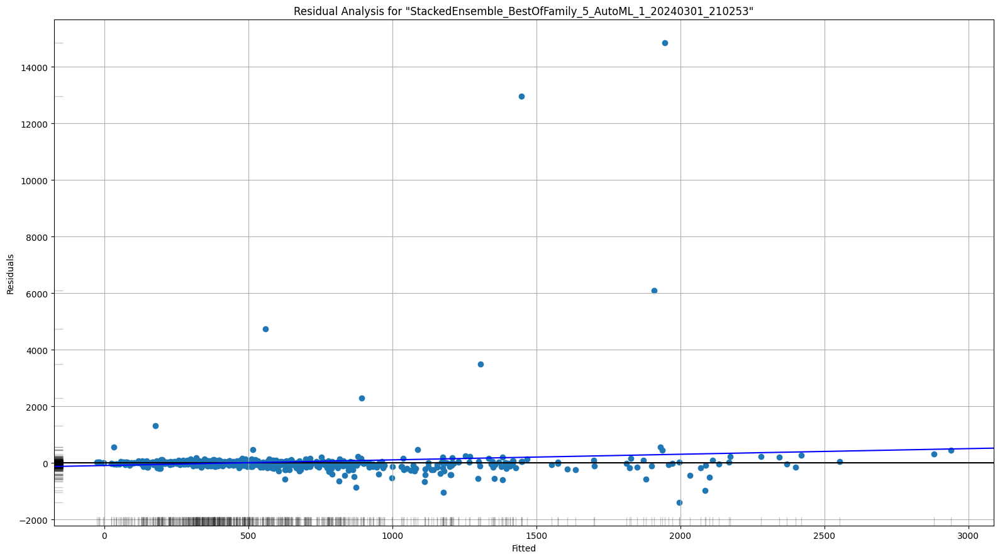

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

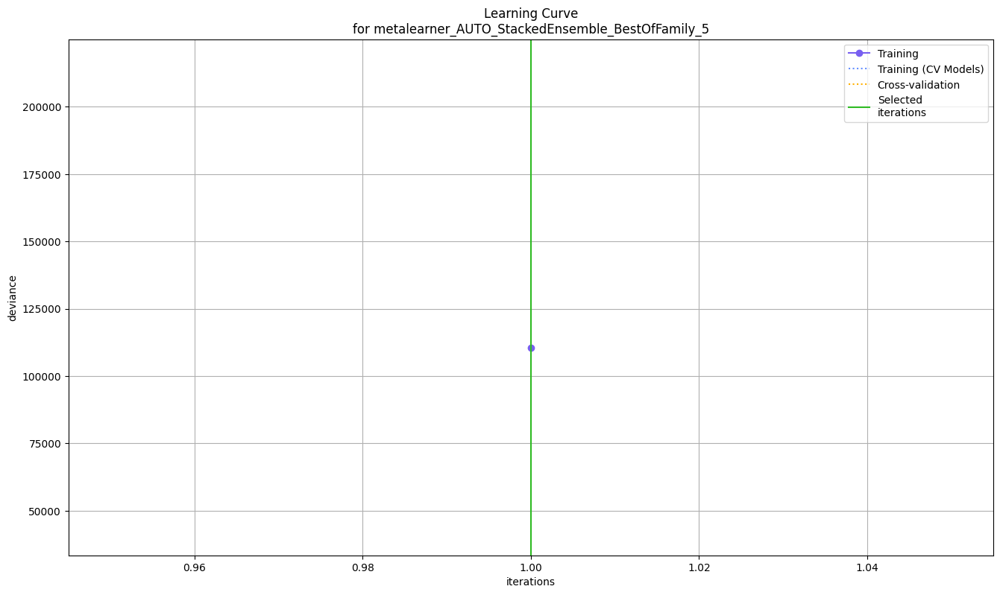

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

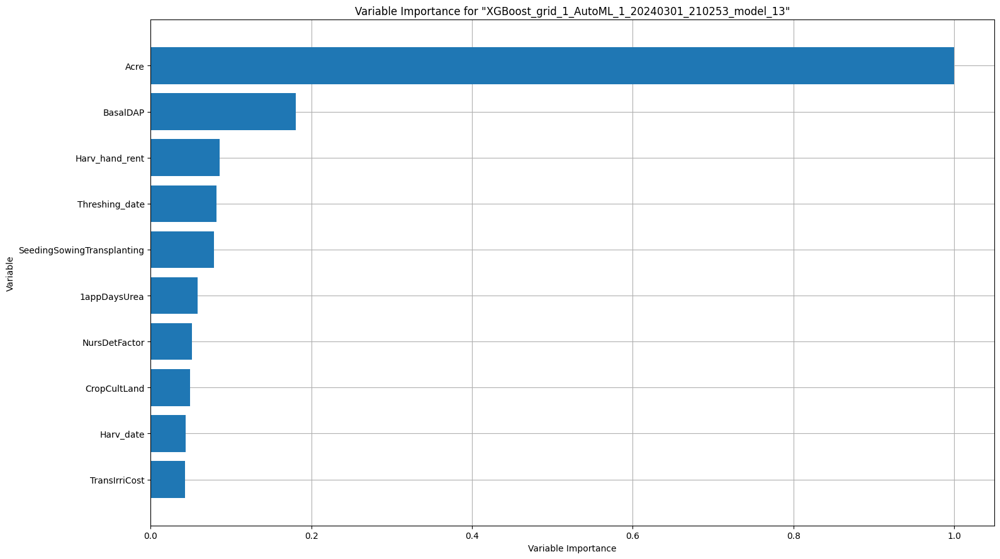

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

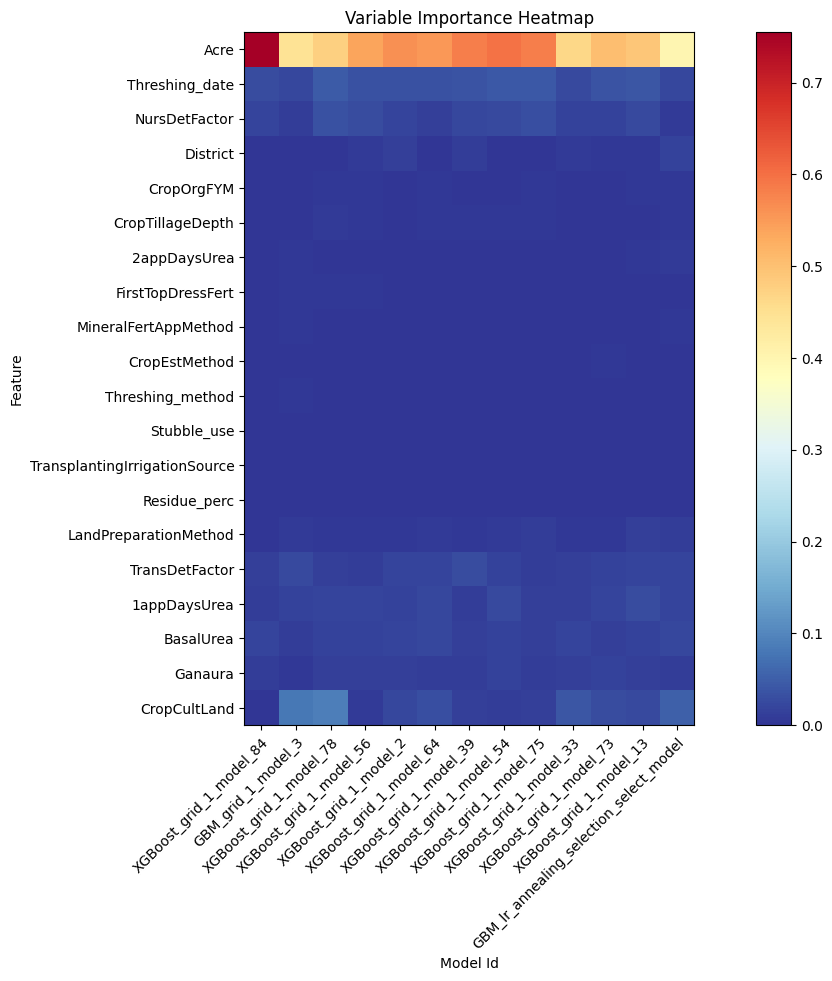

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

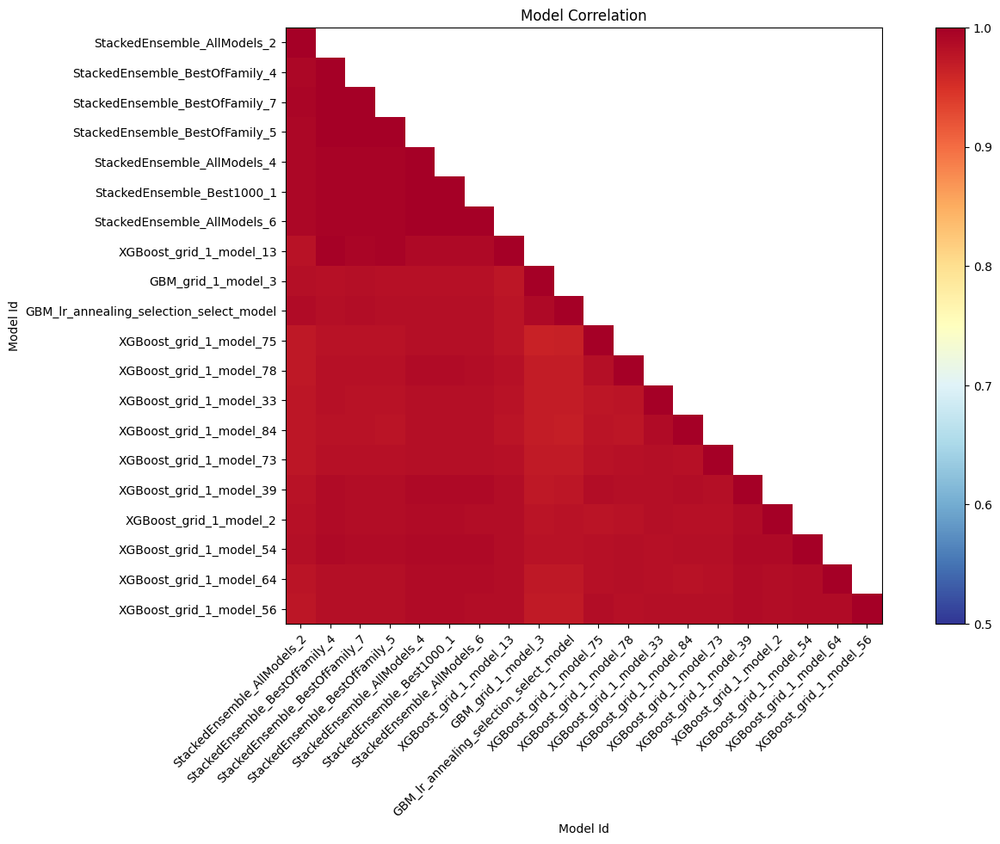

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

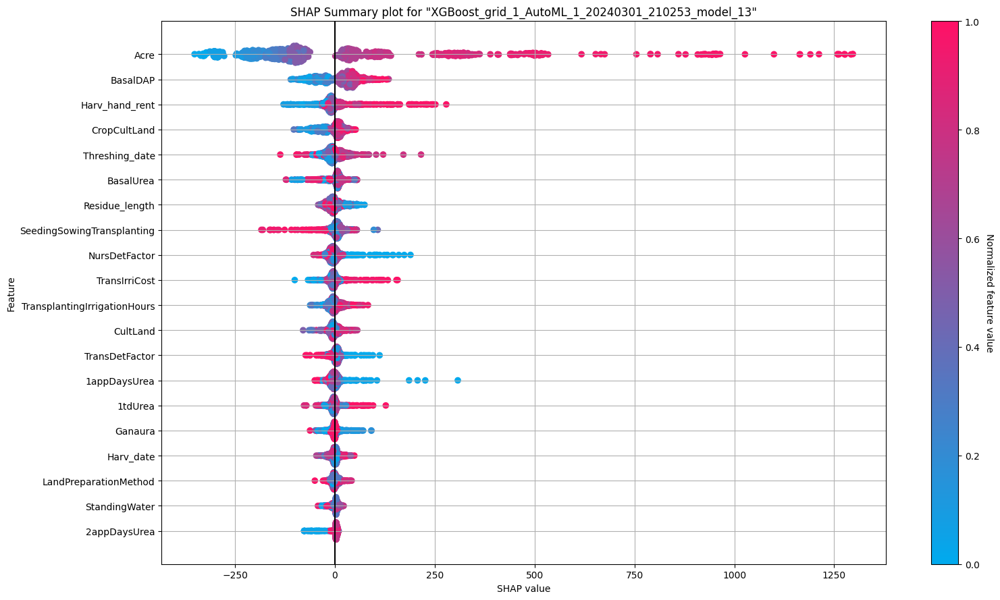

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

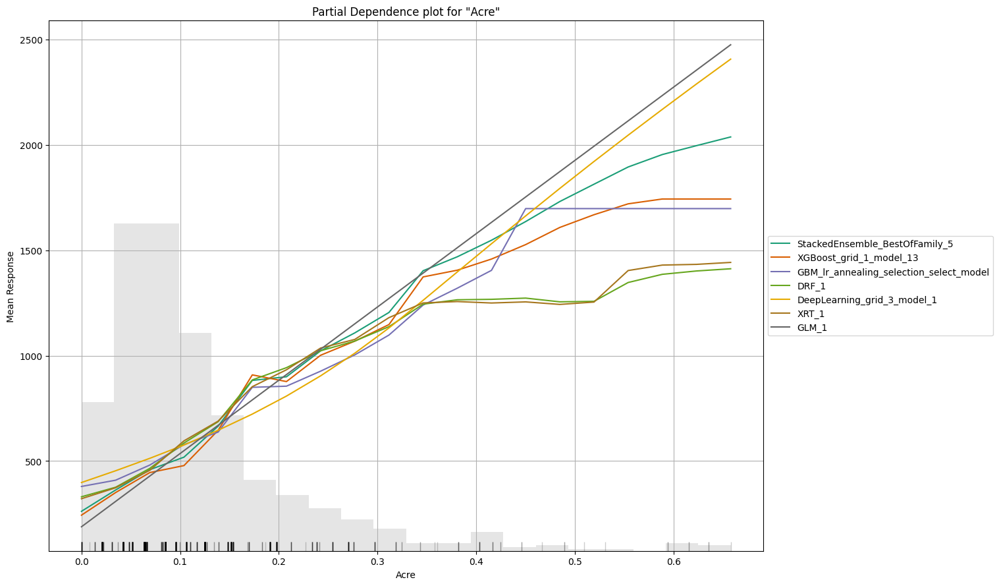

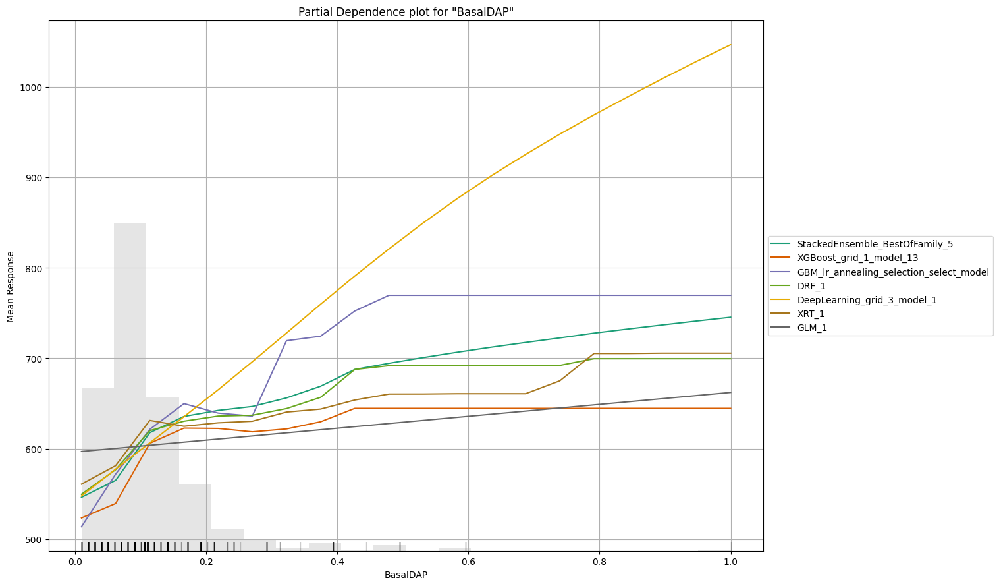

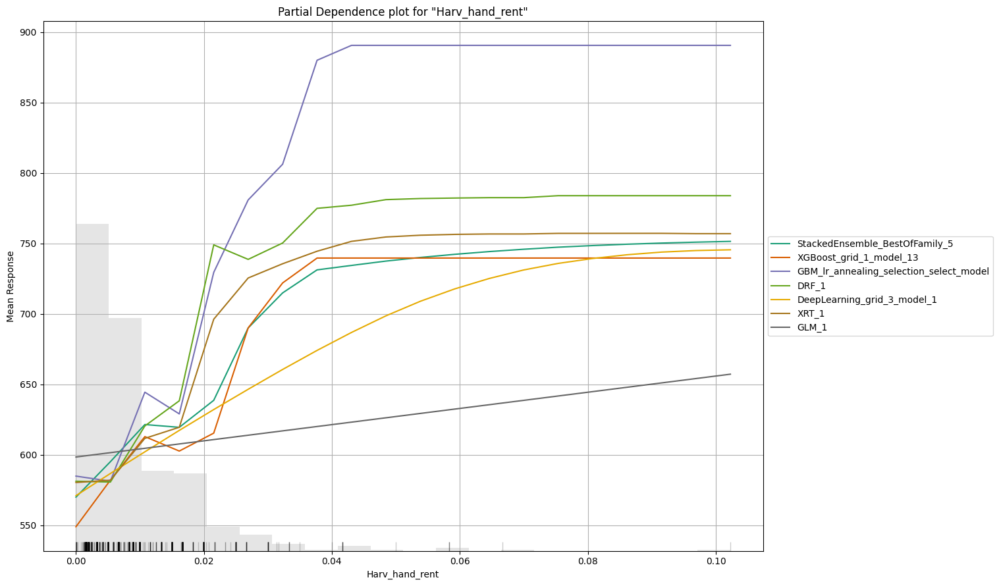

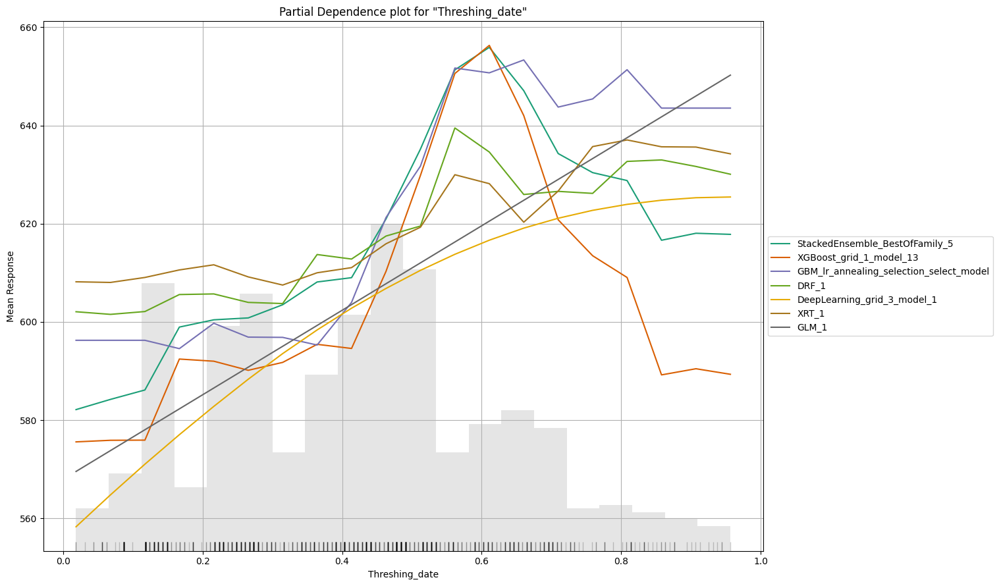

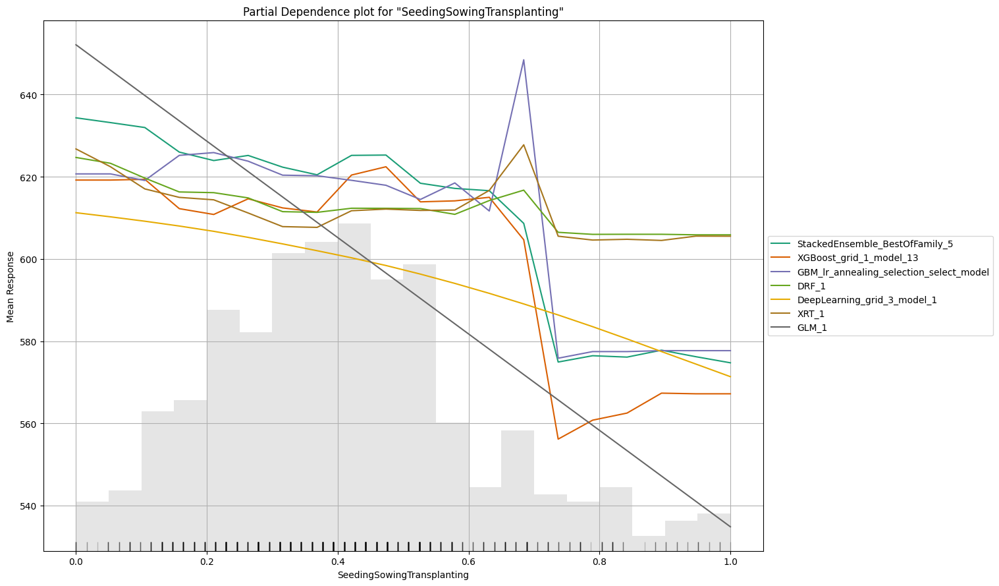

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

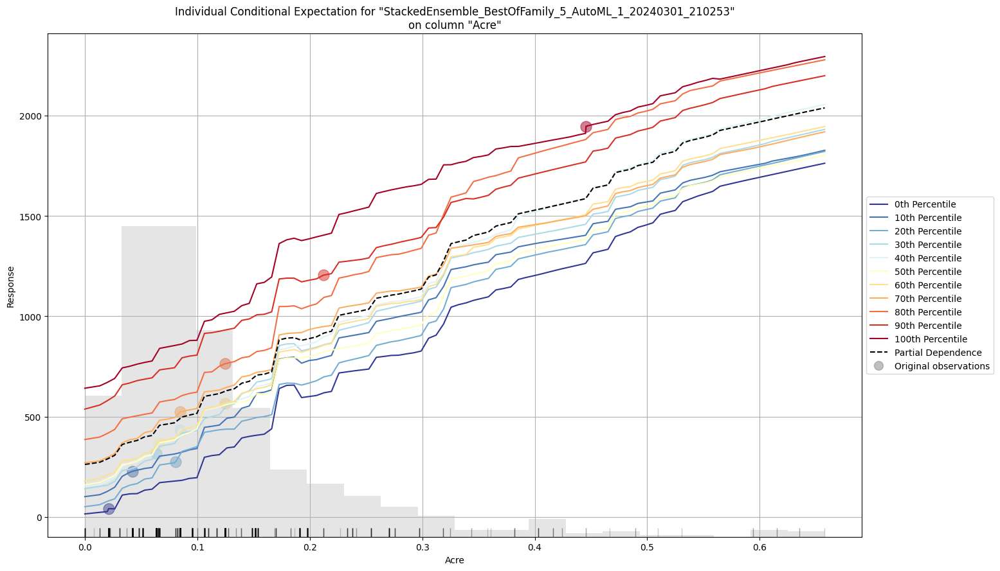

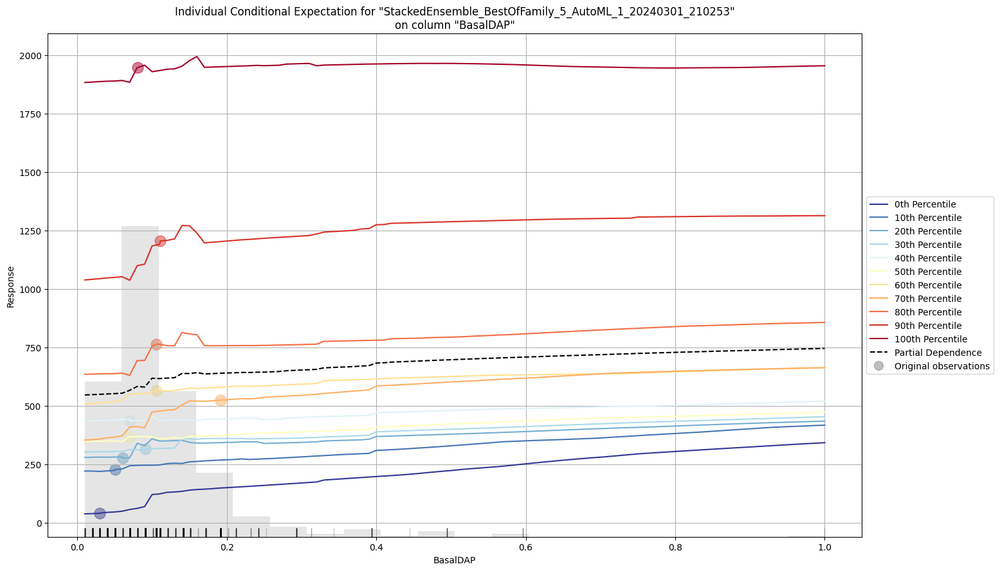

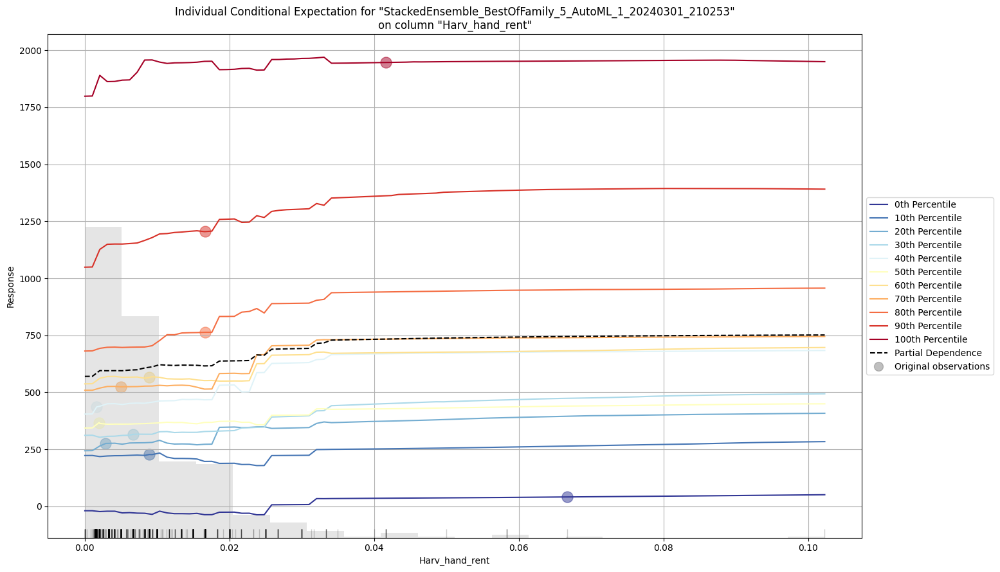

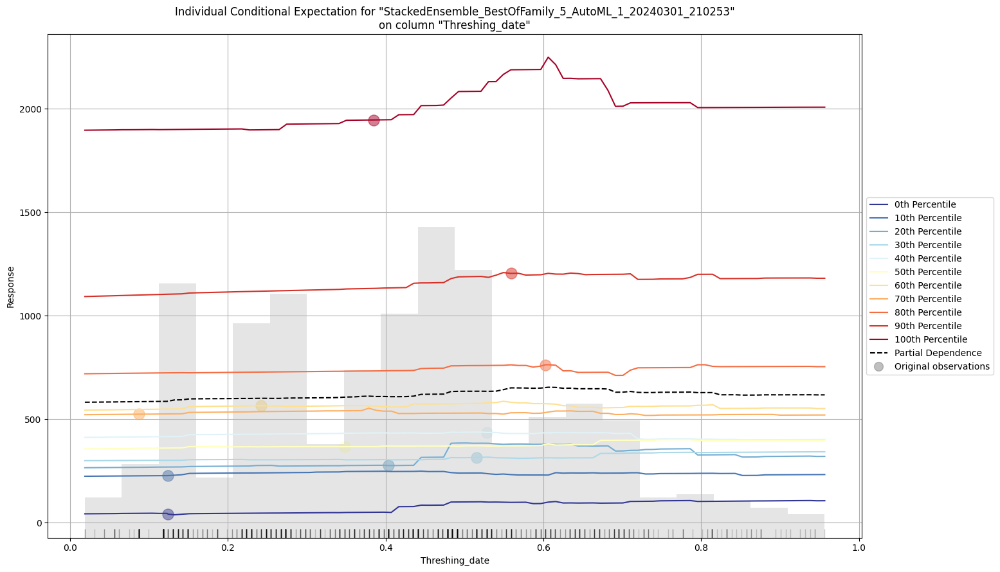

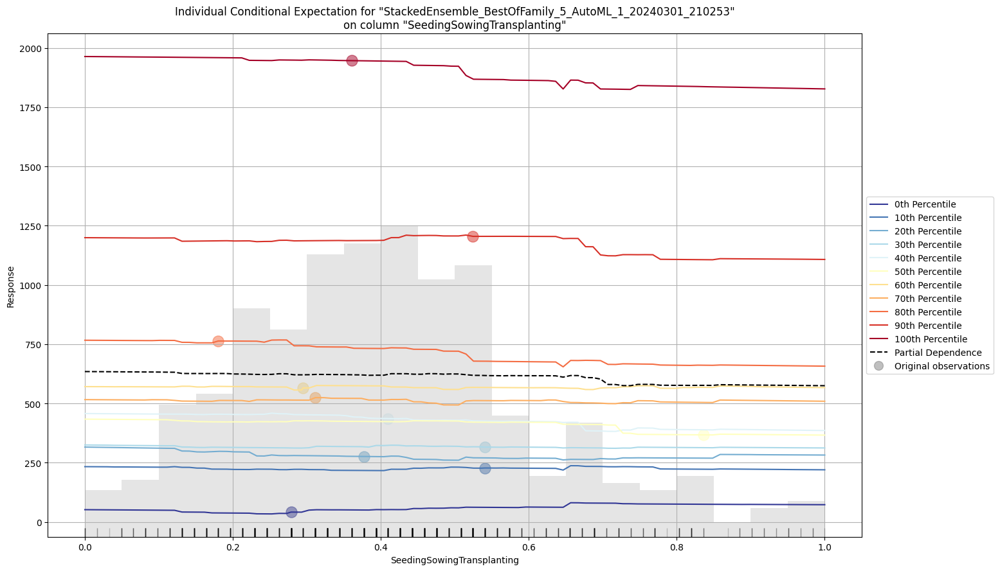

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

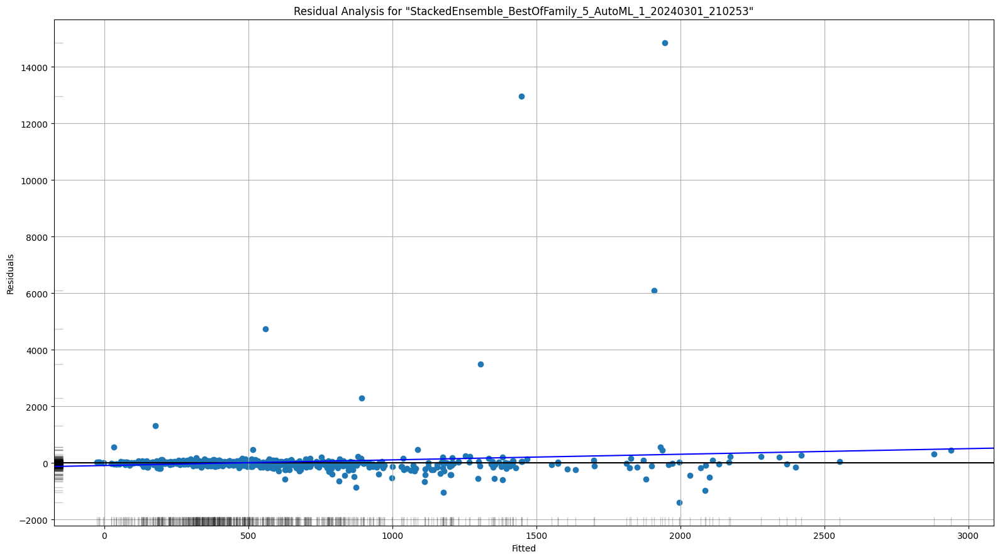

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

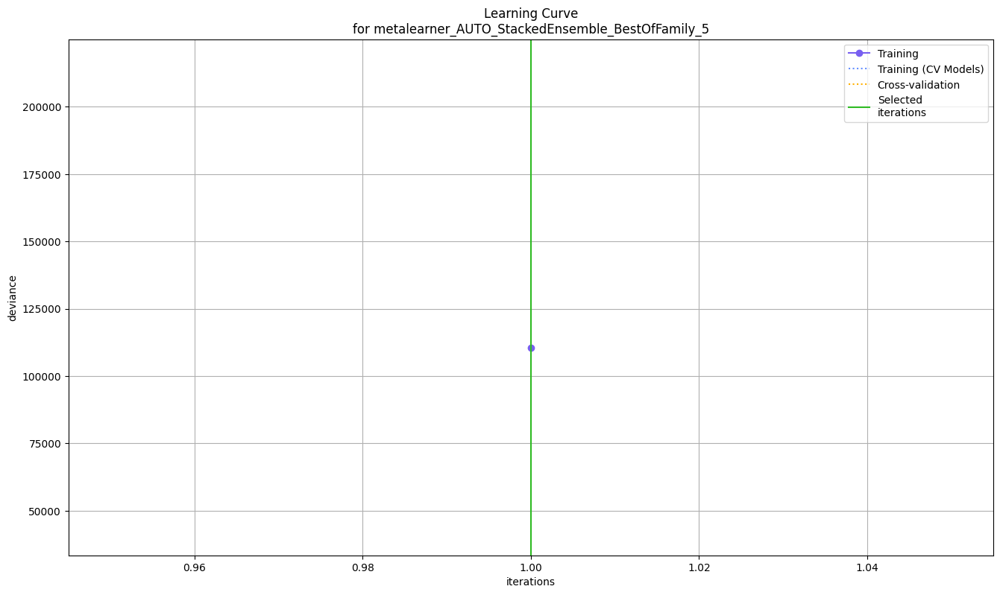

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

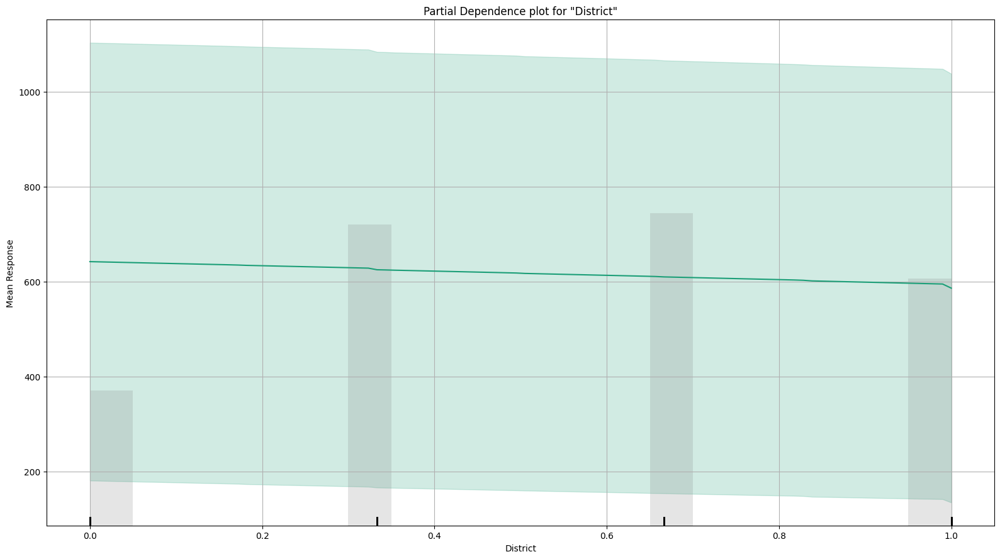

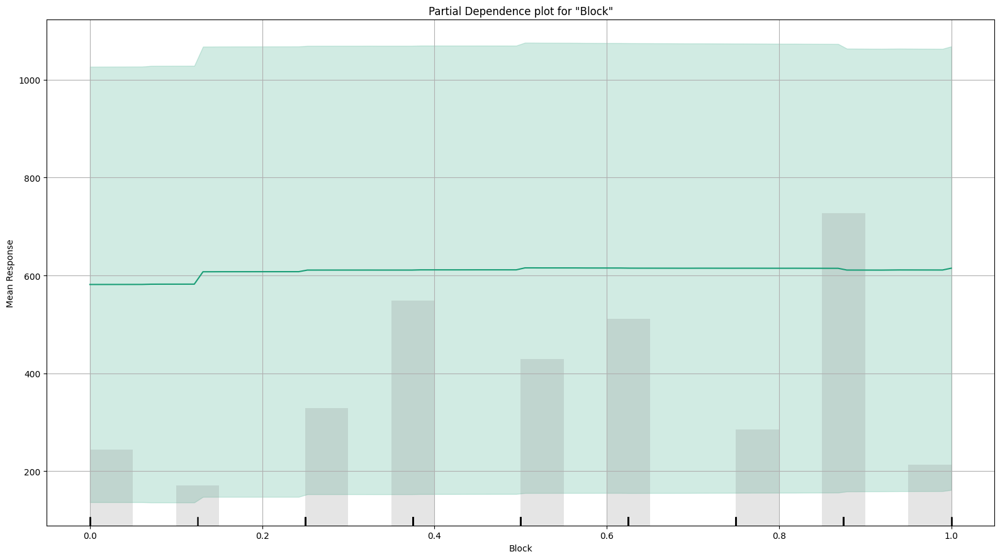

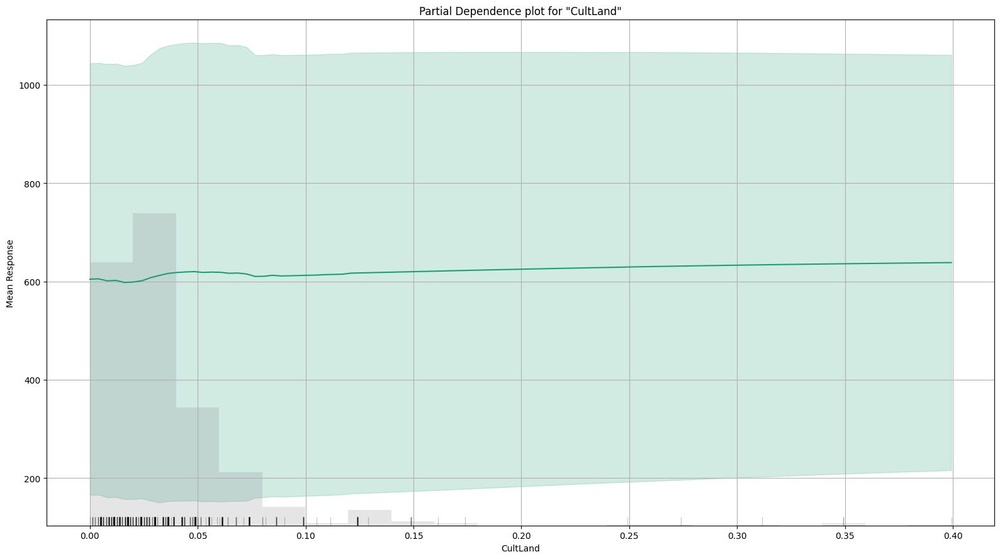

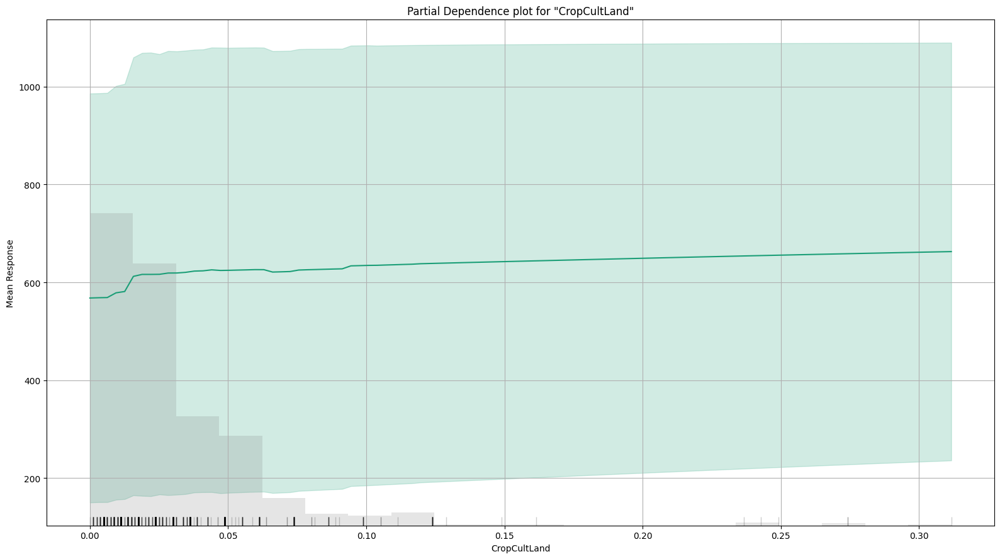

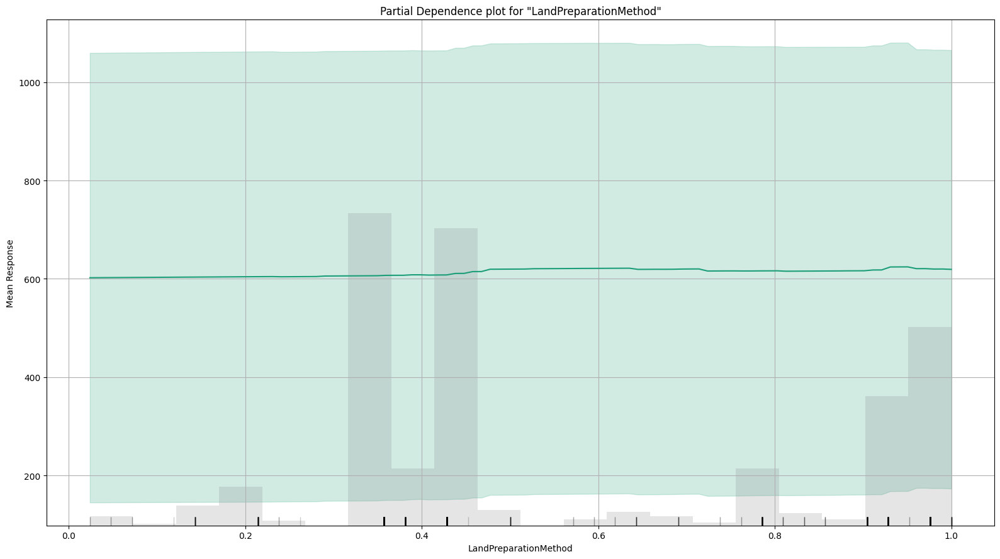

...

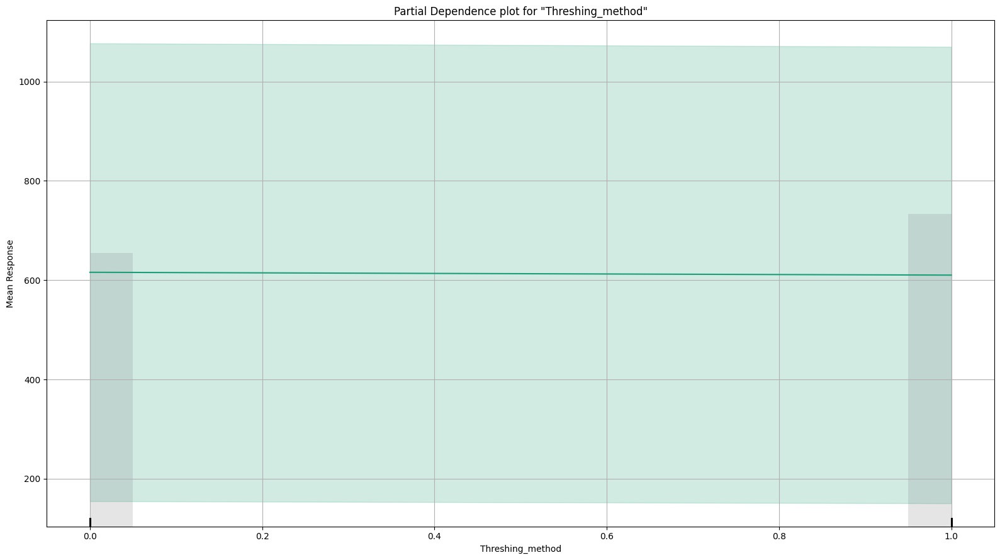

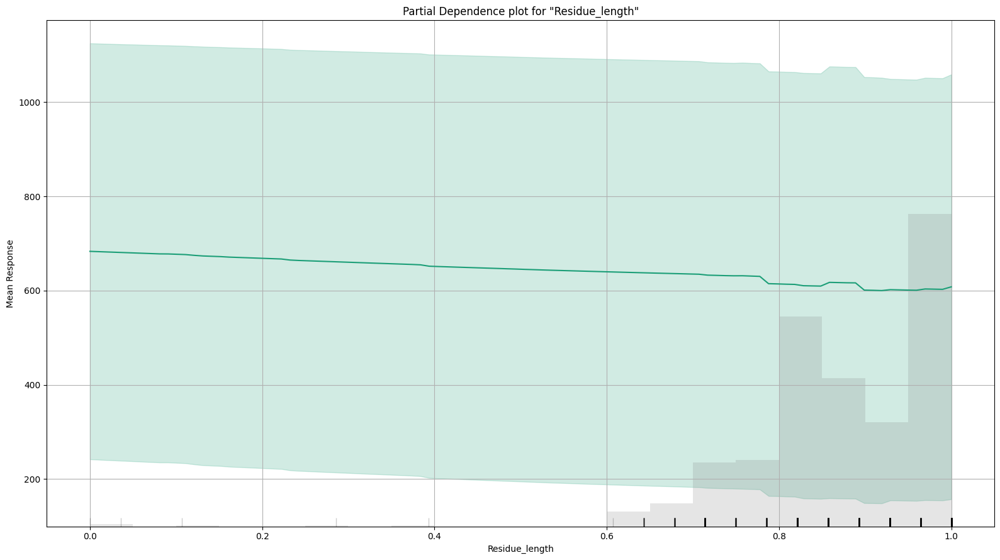

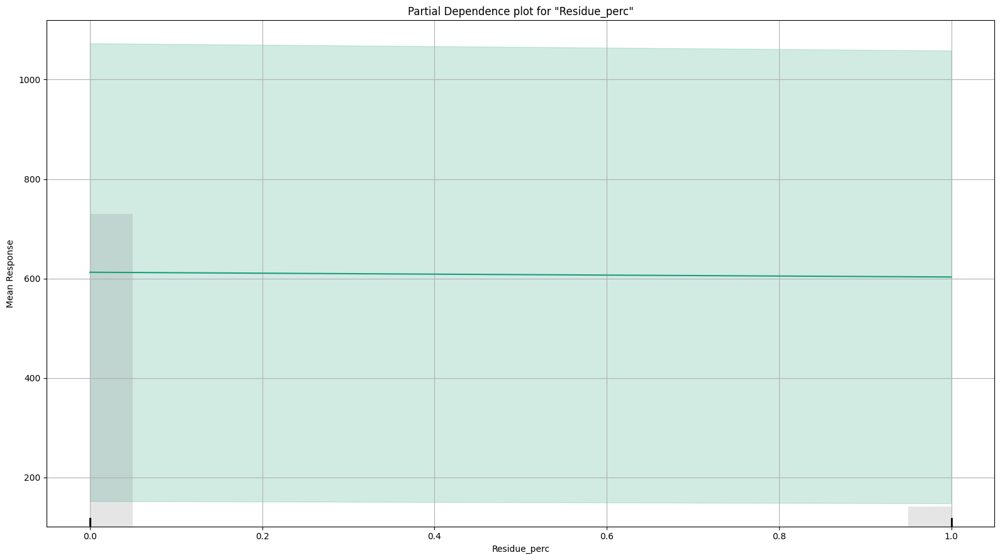

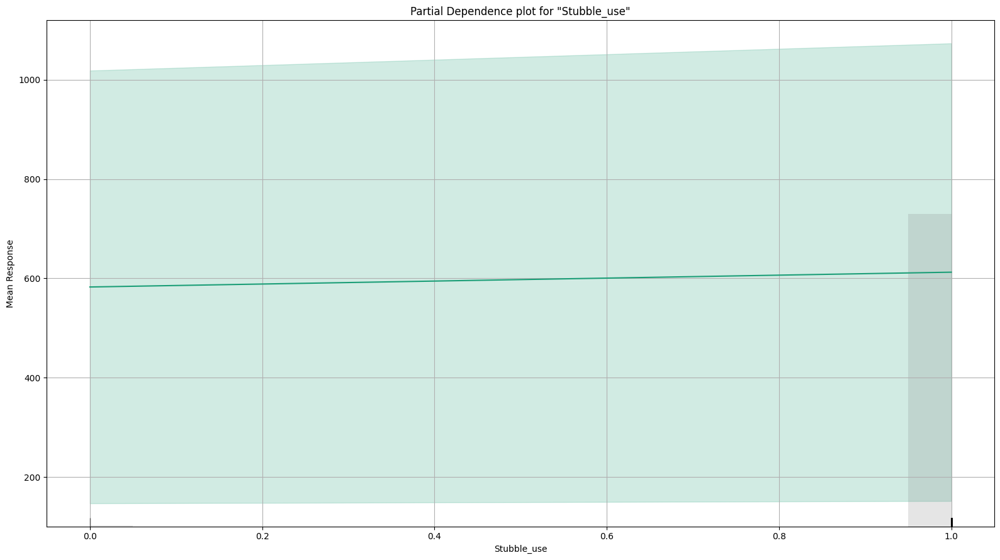

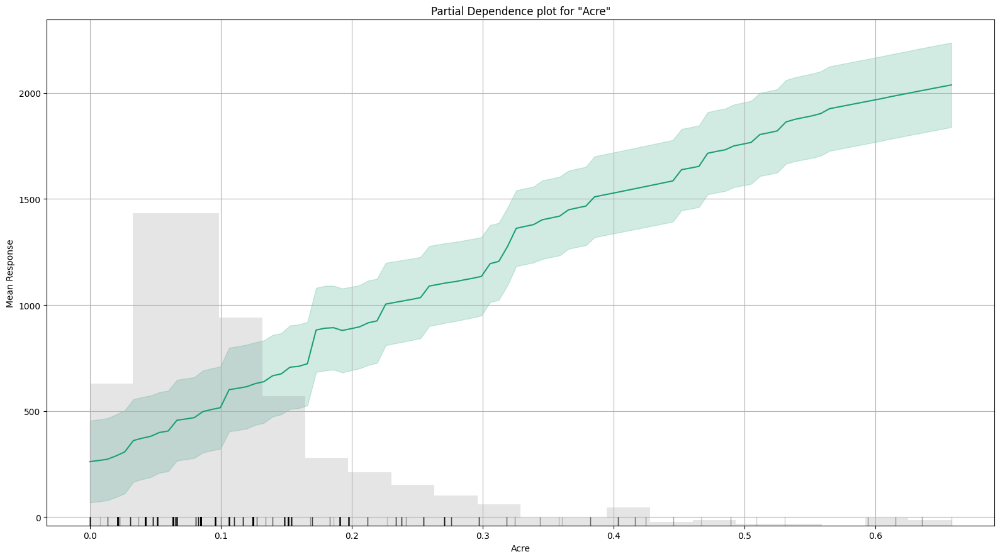

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

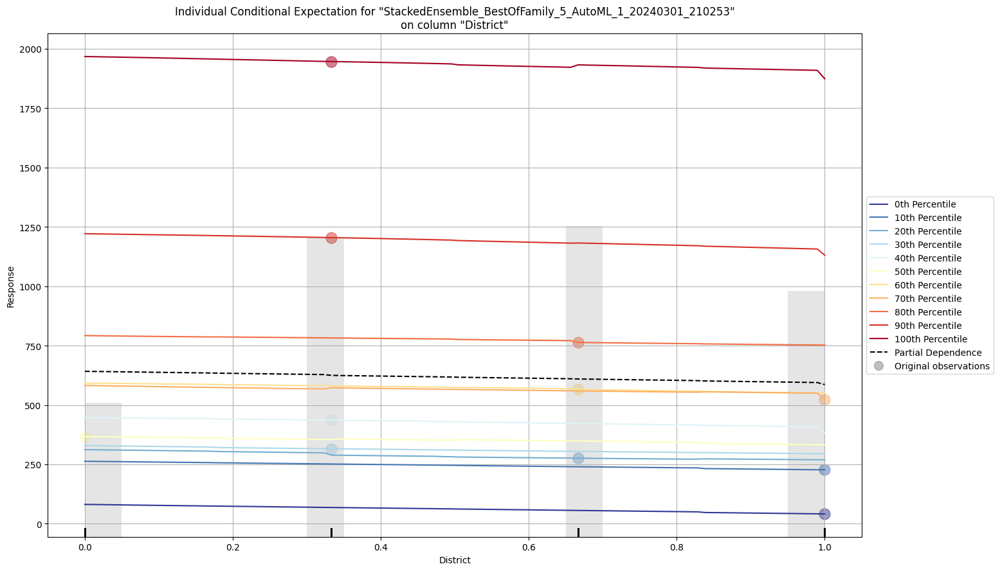

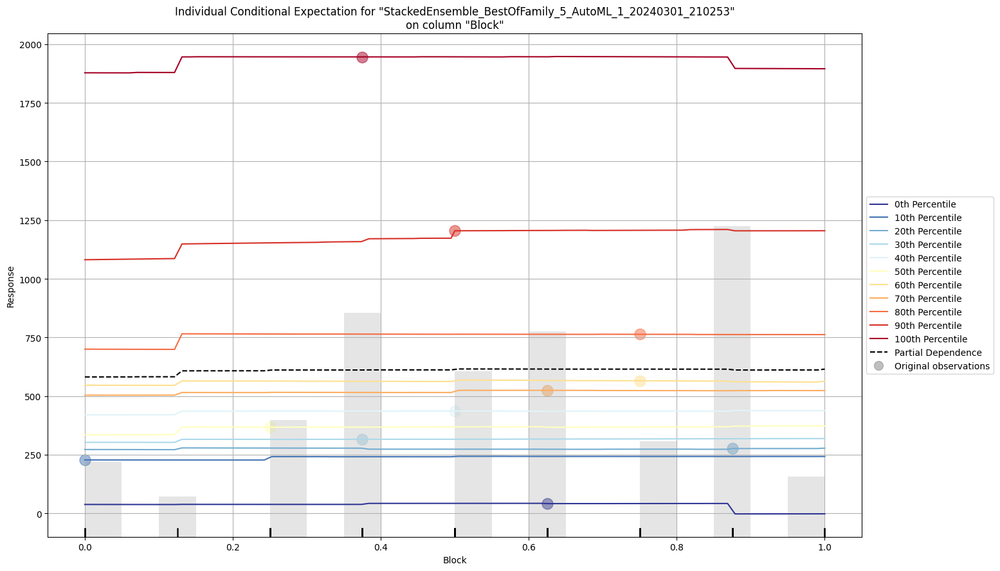

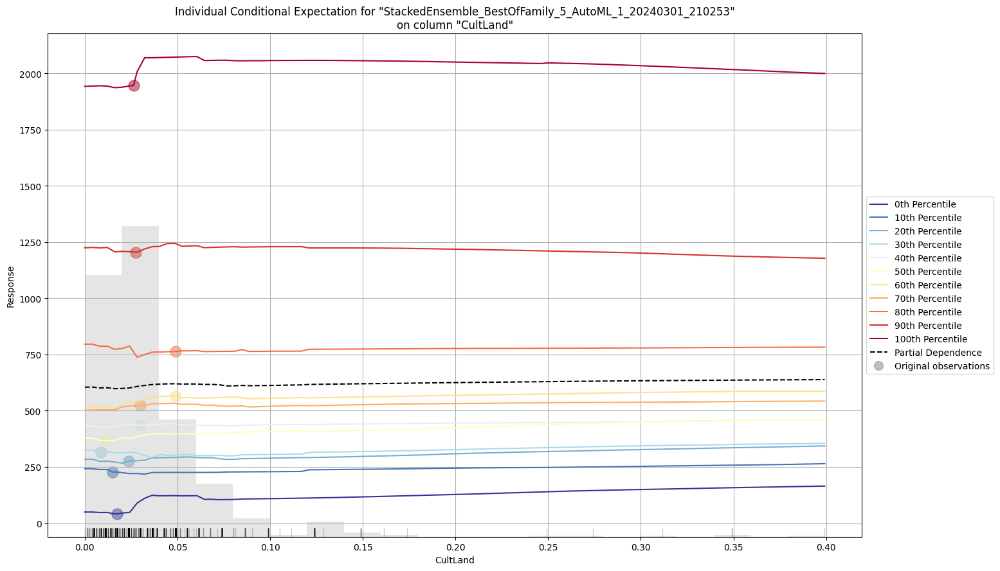

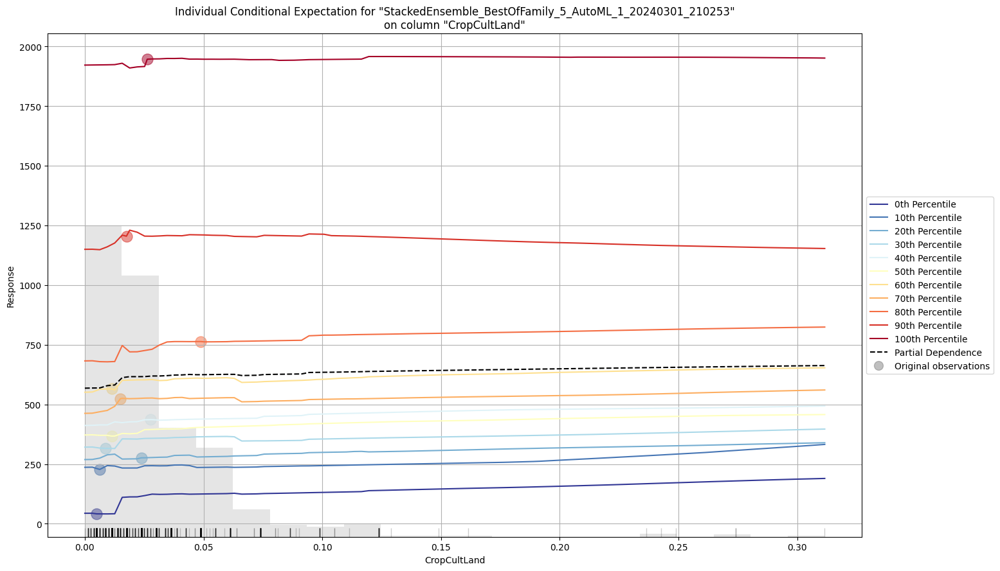

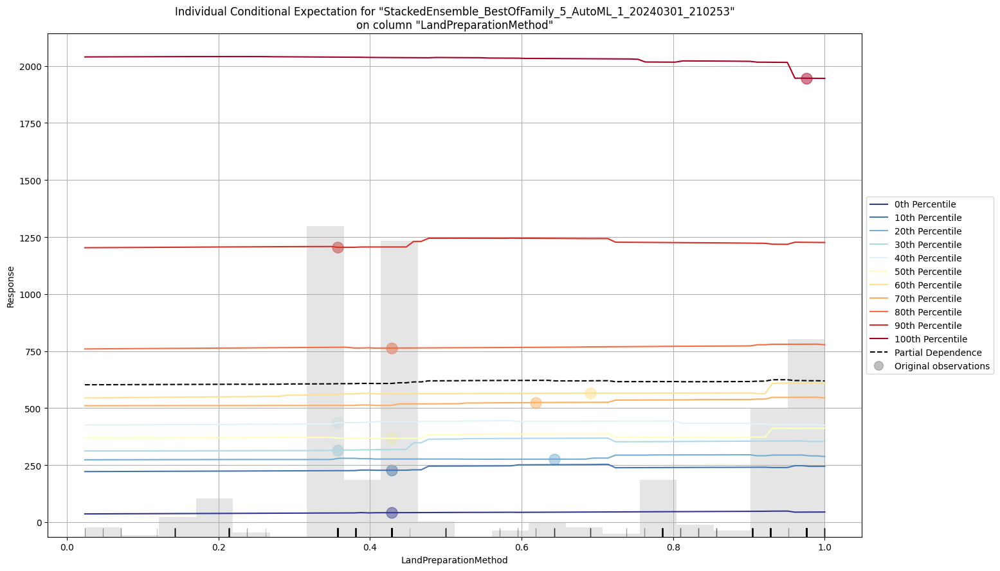

...

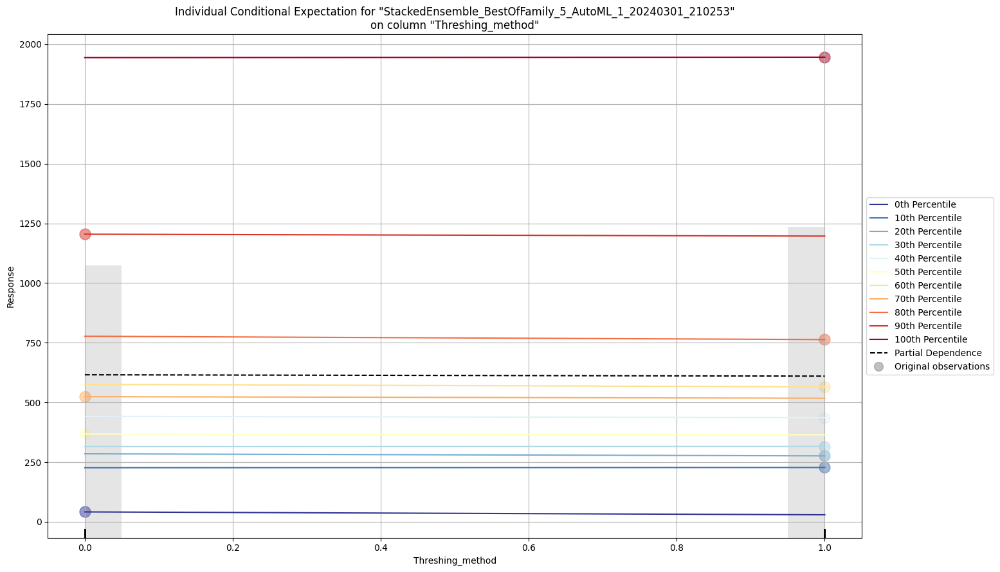

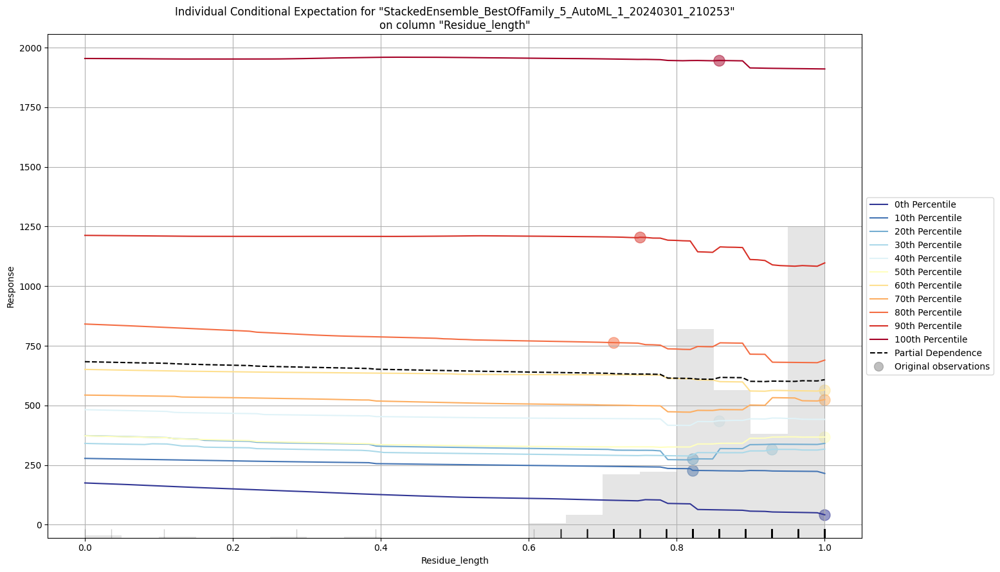

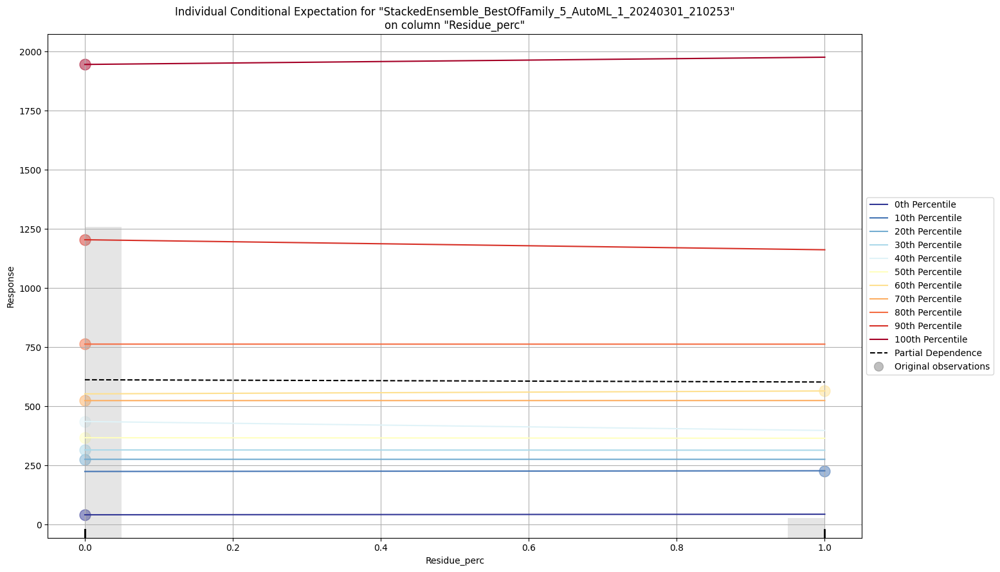

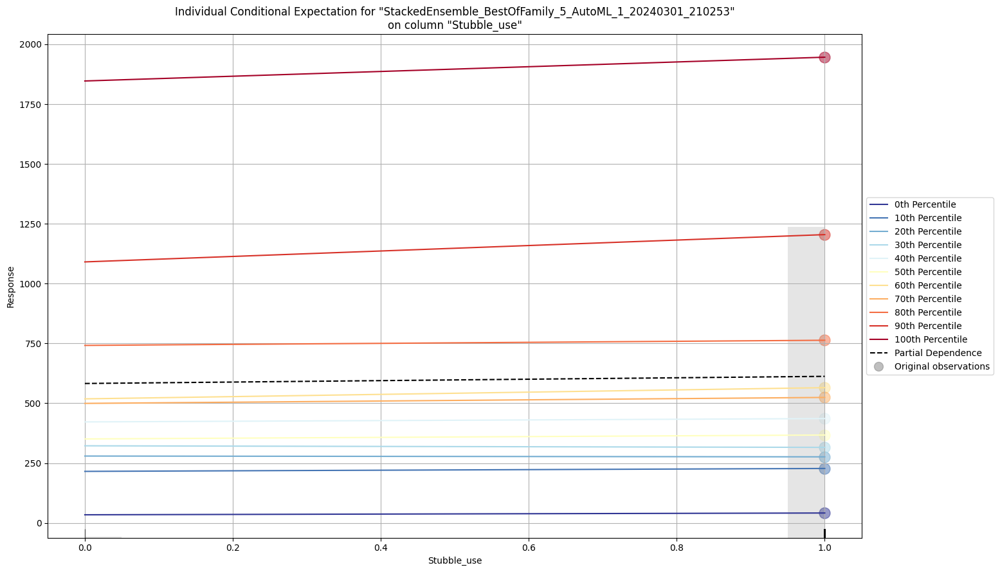

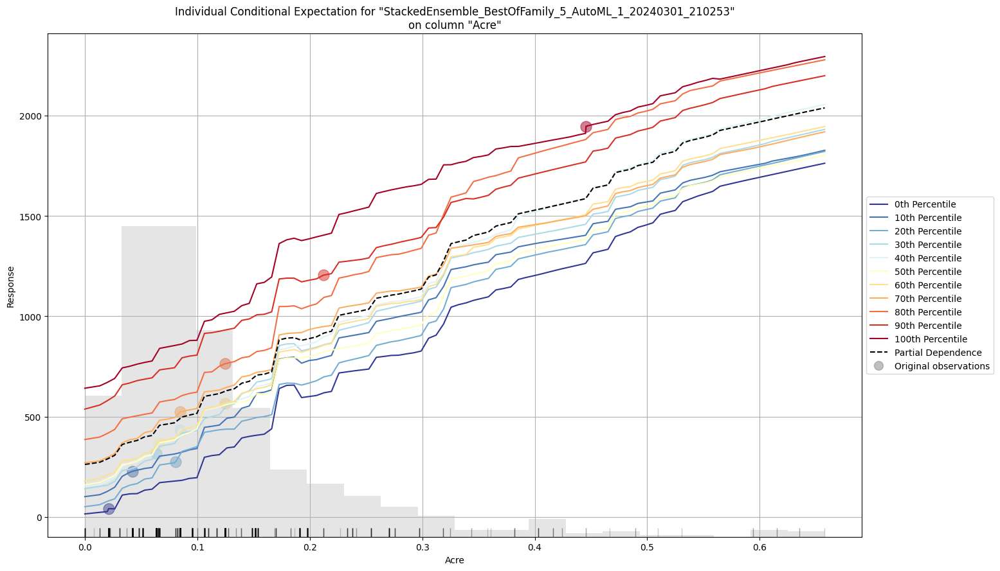

In [2]:
# Evaluate model
pred = aml.leader.predict(h2o_test)

# Get leaderboard with all possible columns
lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")
lb

# Get the best XGBoost model, ranked by logloss, this is just an example about how to use the method
# You can also use other algorithms and criterions
xgb = aml.get_best_model(algorithm="xgboost")

perf = aml.leader.model_performance(h2o_test)
print(perf)

# Use the newly developed method from H2o to explain the result
exa = aml.explain(h2o_test)

# Explain a single model
exm = aml.leader.explain(h2o_test)

In [ ]:
from h2o.estimators import H2OXGBoostEstimator
# Train a new XGBoost model
xgb = H2OXGBoostEstimator(ntrees=10, max_depth=5, learn_rate=0.01)
xgb.train(x=x, y=y, training_frame=h2o_train)   

# save the memory
import gc
gc.collect()

In [3]:
# Next we will use the AutoSklearn library to train the model
# We will only use the train dataset to train the model
from autosklearn.regression import AutoSklearnRegressor

# Instantiate and fit the model
automl = AutoSklearnRegressor(time_left_for_this_task=3600, per_run_time_limit=300)
automl.fit(X_train, y_train)

# Evaluate the model
predictions = automl.predict(X_test)

TypeError: unhashable type: 'list'

/home/lmmista-wap266/anaconda3/envs/automl/lib/python3.9/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


Optimization Progress:   8%|▊         | 24/300 [00:30<05:08,  1.12s/pipeline]

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7fc6eda8f940>
Traceback (most recent call last):
  File "/home/lmmista-wap266/anaconda3/envs/automl/lib/python3.9/site-packages/threadpoolctl.py", line 1008, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/home/lmmista-wap266/anaconda3/envs/automl/lib/python3.9/site-packages/threadpoolctl.py", line 1147, in _make_controller_from_path
    lib_controller = controller_class(
  File "/home/lmmista-wap266/anaconda3/envs/automl/lib/python3.9/site-packages/threadpoolctl.py", line 113, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/home/lmmista-wap266/anaconda3/envs/automl/lib/python3.9/ctypes/__init__.py", line 382, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: dlopen() error


                                                                              
Generation 1 - Current best internal CV score: -117440.99682715023
                                                                              
Generation 2 - Current best internal CV score: -117440.99682715023
                                                                              
Generation 3 - Current best internal CV score: -117033.12060474875
                                                                              
Generation 4 - Current best internal CV score: -116168.86682144595
                                                                              
Generation 5 - Current best internal CV score: -115595.19382461472
                                                                              
Best pipeline: RandomForestRegressor(input_matrix, bootstrap=False, max_features=0.4, min_samples_leaf=1, min_samples_split=3, n_estimators=100)


In [ ]:
from tpot import TPOTRegressor

# Instantiate and fit the model
tpot = TPOTRegressor(generations=100, population_size=100, mutation_rate=0.9,
                         crossover_rate=0.1,
                         scoring='neg_mean_squared_error', cv=5,
                         subsample=1.0, n_jobs=1,max_eval_time_mins=5,
                         verbosity=2, random_state=42)
tpot.fit(X_train, y_train)

# Evaluate the model
predictions = tpot.predict(X_test)

In [ ]:
# Show the performance of the model

print(tpot.score(X_test, y_test))

In [ ]:
# The tpot package has a special method to export the model to a python file
tpot.export('tpot_pipeline.py')